## Exchange Rate Dynamics: INR/USD (Jan 2013 - Dec 2025), Vector Autoregression.

### Structure:-
____________________________________________________________________

- Part 1: Environment Setup & Library Imports
- Part 2: Data Import & Initial Inspection
- Part 3: Missing Value Imputation
- Part 4: Data Manipulation (INR -> USD conversion)
- Part 5: Feature Engineering (CAB/GDP, INT_DIFF, logs, etc.)
- Part 6: Exploratory Data Analysis
- Part 7: Unit Root Tests (ADF + KPSS + PP)
- Part 8: Making all variables Stationary
- Part 9: Vector Autoregression
- Part 10: Impulse Response Functions
- Part 11: Interpretation
- Part 12: Conclusion
____________________________________________________________________

### PART 1: ENVIRONMENT SETUP & LIBRARY IMPORTS

In [1]:
import pandas as pd
import numpy as np
import matplotlib
matplotlib.use('Agg')
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from statsmodels.tsa.stattools import adfuller, kpss, grangercausalitytests
from arch.unitroot import PhillipsPerron
from statsmodels.tsa.vector_ar.var_model import VAR
from statsmodels.regression.linear_model import OLS
from statsmodels.tools import add_constant
from scipy import stats

#-- Global plot style ------------------------------------------
# Setting these once means every chart produced inherits them.
# figure.dpi=300 -> publication quality (journals require >= 300 DPI)
# font.family='serif' -> matches the Times New Roman convention in academic economics papers.
plt.rcParams.update({
    'figure.dpi'     : 300,
    'font.family'    : 'serif',
    'font.size'      : 10,
    'axes.labelsize' : 11,
    'axes.titlesize' : 12,
    'legend.fontsize': 9,
})

print("="*65)
print("  RESEARCH PIPELINE STARTED")
print("="*65)

  RESEARCH PIPELINE STARTED


### PART 2: DATA IMPORT AND INITIAL INSPECTION

In [2]:
print("\n" + "-" * 65)
print("  PART 2: DATA IMPORT")
print("-" * 65)

df_raw = pd.read_excel('Sub_Sample.xlsx', parse_dates=['Date'])

df_raw = df_raw.set_index('Date')

df_raw.index = df_raw.index + pd.offsets.MonthEnd(0)    # This ensures all monthly series align on the same calendar day.

print(f"\n Rows loaded  : {df_raw.shape[0]}")
print(f" Columns loaded : {df_raw.shape[1]}")
print(f" Date range     : {df_raw.index[0].date()} -> {df_raw.index[-1].date()}")

print("\n Column inventory:")
for col in df_raw.columns:
    print(f" {col:<40} dtype: {df_raw[col].dtype}")

print("\n Missing values before imputation:")
miss = df_raw.isnull().sum()
for col, n in miss[miss > 0].items():
    dates = df_raw[df_raw[col].isna()].index.date.tolist()
    print(f" {col:<40} {n} missing at {dates}")

print("\n Sample values - first 5 rows:")
print(df_raw[['INR_USD', '3M_ForwardPremium_IND(%)', '91D_TBillYield_IND(%)', 'FPI_Equity_IND($M)', 'VIX_US', 'BrentCrudeOilPrice($)']].head(5).to_string())


-----------------------------------------------------------------
  PART 2: DATA IMPORT
-----------------------------------------------------------------

 Rows loaded  : 158
 Columns loaded : 23
 Date range     : 2013-01-31 -> 2026-02-28

 Column inventory:
 INR_USD                                  dtype: float64
 3M_ForwardPremium_IND(%)                 dtype: float64
 RepoRate_IND(%)                          dtype: float64
 FCA_IND($M)                              dtype: float64
 CPI_IND                                  dtype: float64
 BroadMoney_M3_IND(₹Cr)                   dtype: float64
 NGDP_CP_IND(₹Cr)                         dtype: float64
 CAB_IND($M)                              dtype: float64
 TradeBalance_IND($M)                     dtype: float64
 FPI_Equity_IND($M)                       dtype: int64
 FPI_Debt_IND($M)                         dtype: int64
 Net_FDI_IND($M)                          dtype: float64
 VIX_IND                                  dtype: float64
 RE

### PART 3: MISSING VALUE IMPUTATION

- With only 158 monthly observations, dropping even one row loses an entire month of information across all variables - not just the one with the missing value. Since the missing values are isolated (1-2 observations each), imputation is far superior to deletion.

- Linear Interpolation: For a single gap between two known values A and B, linear interpolation estimates the missing values as the midpoint. This is the most accurate unbiased estimate for a smooth series.

- Forward Fill: Replaces missing values in a sequence with the most recent known observation, avoids speculative extrapolation. (Though, these rows are trimmed from the analytical sample anyway.)*

In [3]:
print("\n" + "-" * 65)
print("  PART 3: MISSING VALUE IMPUTATION")
print("-" * 65)

df = df_raw.copy()    # Working on a copy to preserve raw data

#-- 3A. BroadMoney M3, November 2025 --------------------------
# Interpolate (method='linear') fills the NaN by drawing a straight line between the nearest non-null neighbours.
df['BroadMoney_M3_IND(₹Cr)'] = df['BroadMoney_M3_IND(₹Cr)'].interpolate(method='linear')
print("\n BroadMoney M3 (Nov-2025): linear interpolation applied")

#-- 3B. CPI US, October 2025 -------------------------------------
df['CPI_US'] = df['CPI_US'].interpolate(method='linear')
print("\n CPI US (Oct-2025): linear interpolation applied")

#-- 3C. NGDP and CAB, Jan & Feb 2026 -----------------------------
# ffill() = forward fill = carry last valid value forward
df['NGDP_CP_IND(₹Cr)'] = df['NGDP_CP_IND(₹Cr)'].ffill()
df['CAB_IND($M)'] = df['CAB_IND($M)'].ffill()
print("\n  NGDP (Jan,Feb-2026): forward fill applied")
print("  CAB (Jan,Feb-2026): forward fill applied")

#-- 3D. Verify zero missing values ------------------------------
remaining = df.isnull().sum().sum()
print(f"\n Missing values after imputation: {remaining} <- should be 0")

#-- 3E. Trim to clean analytical window -------------------------
# Jan and Feb 2026 are forward-filled estimates and represent incomplete months. My analytical sample is Jan 2013 - Dec 2025.
# 156 monthly observations - adequate for VAR/VECM estimation.
df = df[:'2025-12-31']
print(f"\n Analytical window: {df.index[0].date()} -> {df.index[-1].date()}")
print(f" Observations: {len(df)}")

#-- 3F. Fix data types ------------------------------------------
# FPI Equity and FPI Debt are stored as int64 (integers).
# Converting to float64 so no decimal precision is lost in subsequent calculations.
df['FPI_Equity_IND($M)'] = df['FPI_Equity_IND($M)'].astype(float)
df['FPI_Debt_IND($M)'] = df['FPI_Debt_IND($M)'].astype(float)
print("\n FPI Equity and Debt: int64 -> float64 (decimal precision restored)")


-----------------------------------------------------------------
  PART 3: MISSING VALUE IMPUTATION
-----------------------------------------------------------------

 BroadMoney M3 (Nov-2025): linear interpolation applied

 CPI US (Oct-2025): linear interpolation applied

  NGDP (Jan,Feb-2026): forward fill applied
  CAB (Jan,Feb-2026): forward fill applied

 Missing values after imputation: 0 <- should be 0

 Analytical window: 2013-01-31 -> 2025-12-31
 Observations: 156

 FPI Equity and Debt: int64 -> float64 (decimal precision restored)


### PART 4: DATA MANIPULATION - INR TO USD CONVERSION

- VAR model needs variables in comparable units. BroadMoney M3 and NGDP are in INR Crore. All flow variables (FPI, CAB, FCA, TradeBalance) are in USD Million. So conversion is needed of all INR-denominated variables to USD Million.

- Conversion Formula: ((Value in INR Crore x 10,000,000) ÷ INR_USD) ÷ 1,000,000 = Value in USD Million. i.e., USD Million = (INR Crore x 10) ÷ INR_USD.

In [4]:
print("\n" + "-" * 65)
print("  PART 4: DATA MANIPULATION - INR -> USD CONVERSION")
print("-" * 65)

#-- 4A. Nominal GDP: INR Crore -> USD Million --------------------------
df['NGDP_CP_IND($M)'] = (df['NGDP_CP_IND(₹Cr)'] * 10) / df['INR_USD']

jan13 = df['NGDP_CP_IND($M)'].iloc[0]
print(f"\n NGDP converted to USD Million")
print(f" Jan-2013 value : {jan13:,.0f} USD Million")
print(f" Range          : {df['NGDP_CP_IND($M)'].min():,.0f} -> "
      f"{df['NGDP_CP_IND($M)'].max():,.0f} USD Million")

#-- 4B. Broad Money M3: INR Crore -> USD Million ---------------------------------
df['BroadMoney_M3_IND($M)'] = (df['BroadMoney_M3_IND(₹Cr)'] * 10) / df['INR_USD']

print(f"\n Broad Money M3 converted to USD Million")
print(f" Range          : {df['BroadMoney_M3_IND($M)'].min():,.0f} -> "
      f"{df['BroadMoney_M3_IND($M)'].max():,.0f} USD Million")


-----------------------------------------------------------------
  PART 4: DATA MANIPULATION - INR -> USD CONVERSION
-----------------------------------------------------------------

 NGDP converted to USD Million
 Jan-2013 value : 485,246 USD Million
 Range          : 413,955 -> 1,026,412 USD Million

 Broad Money M3 converted to USD Million
 Range          : 1,385,536 -> 3,309,634 USD Million


### PART 5: FEATURE ENGINEERING

Creating economically meaningful new variables from the raw data. Each new variable captures a specific theoretical mechanism identified in the literature review.

-- 5A. CAB as % of GDP -------------------------------------

The exchange rate responds to whether the deficit is sustainable relative to the economy's capacity to finance it. CAB/GDP captures this sustainability signal - the mechanism in Gourinchas & Rey (2005) and Kremens et al. (2024). 

Formula: CAB_PCT_GDP = (CAB/NGDP) x 100

In [5]:
df['CAB_PCT_GDP'] = (df['CAB_IND($M)'] / df['NGDP_CP_IND($M)']) * 100

print(f"\n CAB/GDP (%) constructed")
print(f" Mean           : {df['CAB_PCT_GDP'].mean():.3f}%")
print(f" Range          : {df['CAB_PCT_GDP'].min():.3f}% to {df['CAB_PCT_GDP'].max():.3f}%")
print(f" Surplus months : {(df['CAB_PCT_GDP'] > 0).sum()} / {len(df)}")


 CAB/GDP (%) constructed
 Mean           : -1.168%
 Range          : -5.727% to 3.939%
 Surplus months : 22 / 156


-- 5B. Nominal Interest Rate Differential ------------------

Core of uncovered interest rate parity (UIP): INR/USD should change by the interest differential between India and the USA. India 91-Day T-Bill and US 3-Month T-Bill (both are market rates) are used because they represent the actual return available to portfolio investors - not the policy rate.

Changes in NOM_INT_DIFF_MKT and dynamic relationship with INR_USD are what matter.

In [6]:
df['NOM_INT_DIFF_MKT'] = df['91D_TBillYield_IND(%)'] - df['3M_TBillYield_US(%)']

print(f"\n Nominal Market Interest Rate Differential (NOM_INT_DIFF_MKT) constructed")
print(f" Range : {df['NOM_INT_DIFF_MKT'].min():.3f}% to {df['NOM_INT_DIFF_MKT'].max():.3f}%")


 Nominal Market Interest Rate Differential (NOM_INT_DIFF_MKT) constructed
 Range : 1.138% to 11.290%


-- 5C. Inflation Rates, Year-on-Year -----------------------

Month-on-month CPI changes are dominated by seasonal noise - food prices spike in summer, fall in harvest season. Year-on-year (comparing to same month last year) eliminates all seasonal effects automatically.

Formula: pct_change(12) means, ((value_this_month / value_12_months_ago) - 1) x 100 converts to percentage

- YOY inflation differential (INF_DIFF_YOY) goes in separately to capture the monetary model channel (PPP deviations).

In [7]:
df['INF_IND'] = df['CPI_IND'].pct_change(12) * 100
df['INF_US'] = df['CPI_US'].pct_change(12) * 100

# YoY inflation separately for the monetary model channel
df['INF_DIFF_YOY'] = df['INF_IND'] - df['INF_US']




# Month-on-Month (MoM) inflation is more volatile than Year-on-Year (YoY) but captures short-term dynamics better.
# MoM % change × 12 = annualised monthly inflation
# Matches the monthly frequency of your interest rate exactly
#df['INF_IND_MOM'] = df['CPI_IND'].pct_change(1) * 12 * 100
#df['INF_US_MOM']  = df['CPI_US'].pct_change(1)  * 12 * 100

#df['REAL_INT_DIFF'] = (
#    (df['91D_TBillYield_IND(%)'] - df['INF_IND_MOM']) -
#    (df['3M_TBillYield_US(%)']   - df['INF_US_MOM'])
#)

-- 5D. 3-Month Annualised Inflation ------------------------

The 91-Day T-Bill literally covers 3 months. Matching the inflation horizon to the instrument horizon is the most theoratically precise solution. This is the approach used in most empirical interest parity papers - Frenkel (1981) and Engle-West (2004) both match horizons.

Formula: 3-month % change x 4 = annualised quarterly inflation

Matches the 91-day/3-month horizon of T-Bill rates exactly.

In [8]:
df['INF_IND_3M'] = df['CPI_IND'].pct_change(3) * 4 * 100
df['INF_US_3M'] = df['CPI_US'].pct_change(3) * 4 * 100

-- 5E. Real Interest Rate Differential ---------------------

The Fisher Equation: Real Rate = Nominal Rate - Expected Inflation

Interest parity in its theoratically pure form holds in real terms. Nominal differential alone is misleading - it includes inflation premium. Real differential isolates the genuine return incentive that drives portfolio capital flows. (Here realised inflation is a proxy for expected inflation)

In [9]:
df['REAL_INT_DIFF_MKT'] = (
    (df['91D_TBillYield_IND(%)'] - df['INF_IND_3M']) - 
    (df['3M_TBillYield_US(%)'] - df['INF_US_3M'])
)

-- 5F. RBI FX Intervention Proxy ---------------------------

The RBI is a strategic participant in the FX market - it buys and sells dollars to manage rupee volatility. This intervention serves the mechanical link between FPI flows and the exchange rate. 

Construction: Monthly change in Foreign Currency Assets (FCA) = ΔFCA
- Positive ΔFCA -> RBI accumulated reserves (bought USD, resisted rupee appreciation)
- Negative ΔFCA -> RBI depleted reserves (sold USD, defended rupee against depreciation)

diff() computes: value_this_month - value_previous_month

In [10]:
df['RBI_INTV'] = df['FCA_IND($M)'].diff()

print(f"\n RBI Intervention proxy (ΔFCA) constructed")
print(f" Positive = accumulation, Negative = drawdown")
print(f" Range : {df['RBI_INTV'].dropna().min():,.0f} to "
      f"{df['RBI_INTV'].dropna().max():,.0f} USD Million")


 RBI Intervention proxy (ΔFCA) constructed
 Positive = accumulation, Negative = drawdown
 Range : -27,226 to 24,996 USD Million


-- 5G. Total Net FPI Flows ---------------------------------

The portfolio balance mechanism (Gabaix & Maggiori 2015) responds to total portfolio flows - not just equity. Since the JP Morgan bond index inclusion (2024) has made debt flows the dominant component, combining both gives the most complete picture of the financial flow channel.

In [11]:
df['FPI_Total'] = df['FPI_Equity_IND($M)'] + df['FPI_Debt_IND($M)']

-- 5H. Logarithmic Transformations -------------------------

Why Log Transformation?

- Stationarity: Level variables like INR_USD and oil price trend upward over time (non-stationary). Taking log makes them more linear and their first differences (log returns) are stationary.
- Outlier Reduction: The log function compresses large values.
- Elasticity Interpretation: In a log-log regression, a coefficient of 0.3 means "a 1% increase in X causes a 0.3% change in Y". This is economically intuitive and directly comparable across variables measured in different units.

np.log() computes the natural logarithm (base e).
Only applied to strictly positive variables.

In [12]:
df['LOG_INR_USD'] = np.log(df['INR_USD'])
df['LOG_OIL'] = np.log(df['BrentCrudeOilPrice($)'])
df['LOG_M3_IND'] = np.log(df['BroadMoney_M3_IND($M)'])
df['LOG_NGDP_IND'] = np.log(df['NGDP_CP_IND($M)'])
df['LOG_VIX_US'] = np.log(df['VIX_US'])
df['LOG_VIX_IND'] = np.log(df['VIX_IND'])

-- 5I. Defining model variable sets ------------------------

Three specifications - each tests a different theoretical claim:

- CORE_VARS : Replicates and extends my original EViews model.
- EXTD_VARS : Adds global financial cycle (VIX) + RBI intervention. This is my main model - the theoratical contribution. Does global risk and central bank action suppress the classical transmission mechanism?
- FULL_VARS : All theoratically motivated variables including oil and CAB/GDP - used for robustness checks. Do structural current account position and commodity prices explain residual exchange rate variation?

CAB/GDP is a slow-moving structural variable - it captures the medium to long-run sustainability of India's external position. It changes gradually, driven by trade patterns, remittances, and investment income. Including it in the core or extended model would be theoretically premature - interest parity and portfolio balance operate at higher frequency than the current account adjustment mechanism. In the Full specification it serves as a control variable that absorbs the low-frequency financial transmission channels more cleanly. This is also why Kremens et al. (2024) use it as one of three macro factors explaining medium-term currency expectations - it operates at a different temporal scale than interest differentials and risk measures.

In [13]:
CORE_VARS = [
    'LOG_INR_USD',
    'NOM_INT_DIFF_MKT',
    '3M_ForwardPremium_IND(%)',
    'FPI_Total',
]

EXTD_VARS = [
    'LOG_INR_USD',
    'NOM_INT_DIFF_MKT',
    '3M_ForwardPremium_IND(%)',
    'FPI_Total',
    'LOG_VIX_US',      # Global financial cycle
    'RBI_INTV',        # Central bank intervention
]

FULL_VARS = [
    'LOG_INR_USD',
    'NOM_INT_DIFF_MKT',
    '3M_ForwardPremium_IND(%)',
    'FPI_Total',
    'LOG_VIX_US',      # Global financial cycle
    'RBI_INTV',        # Central bank intervention
    'LOG_OIL',         # Commodity/import cost channel
    'CAB_PCT_GDP',     # External sustainability channel
]

# Drop rows where any FULL_VARS variable is NaN
df_model = df.dropna(subset=FULL_VARS).copy()

print(f"\n Final model dataset: {len(df_model)} observations")
print(f" Period: {df_model.index[0].date()} -> {df_model.index[-1].date()}")
print(f"\n Feature engineering complete - {len(df.columns)} total columns")


 Final model dataset: 155 observations
 Period: 2013-02-28 -> 2025-12-31

 Feature engineering complete - 41 total columns


### PART 6: EXPLORATORY DATA ANALYSIS (EDA)

It is a pre-estimation diagnostic that tells whether the data looks the way theory predicts. Surprises in EDA (unexpected signs, implausible correlations) signal data errors before they contaminate regression results.

-- 6A. Descriptive Statistics ------------------------------

In [14]:
desc_vars = [
    'LOG_INR_USD', 'NOM_INT_DIFF_MKT', '3M_ForwardPremium_IND(%)',
    'FPI_Total', 'LOG_VIX_US', 'LOG_OIL',
    'RBI_INTV', 'CAB_PCT_GDP', 'REAL_INT_DIFF_MKT',
    'INF_IND_3M', 'INF_US_3M'
]

# describe() computes: count, mean, std, min, quartiles, max
desc = df_model[desc_vars].describe().T

# Skewness and Kurtosis - important for checking normality
# Skewness ≠ 0 -> asymmetric distribution
# Kurtosis > 3 -> fat tails (common in financial data)
desc['Skewness'] = df_model[desc_vars].skew()
desc['Kurtosis'] = df_model[desc_vars].kurt()
desc = desc[['mean', 'std', 'min', '25%', '50%', '75%', 'max', 'Skewness', 'Kurtosis']]
desc.columns = ['Mean', 'Std Dev', 'Min', 'Q1', 'Median', 'Q3', 'Max', 'Skewness', 'Kurtosis']

print("\n Descriptive Statistics (Table 1 of paper):")
print(desc.round(4).to_string())


 Descriptive Statistics (Table 1 of paper):
                               Mean    Std Dev         Min         Q1     Median         Q3         Max  Skewness  Kurtosis
LOG_INR_USD                  4.2697     0.1223      3.9848     4.1695     4.2658     4.3947      4.5008   -0.0009   -0.8692
NOM_INT_DIFF_MKT             4.5802     2.4571      1.1376     2.6253     3.8343     6.5868     11.2904    0.5522   -0.7820
3M_ForwardPremium_IND(%)     4.6289     2.2707      1.0757     3.0913     4.2727     6.3775      9.5648    0.3802   -0.7488
FPI_Total                  839.5935  3867.3134 -15921.0000 -1403.0000   932.0000  3276.5000  10809.0000   -0.6176    2.2396
LOG_VIX_US                   2.8275     0.2937      2.3151     2.6226     2.7642     2.9889      4.0559    0.8938    1.3464
LOG_OIL                      4.2321     0.3107      3.2902     4.0309     4.2463     4.4303      4.7681   -0.3740   -0.1464
RBI_INTV                  1878.7586  8686.9196 -27225.6600 -2780.6000  2332.7000  7406.

-- 6B. Time Series Plots -----------------------------------

Visual inspection of all variables.

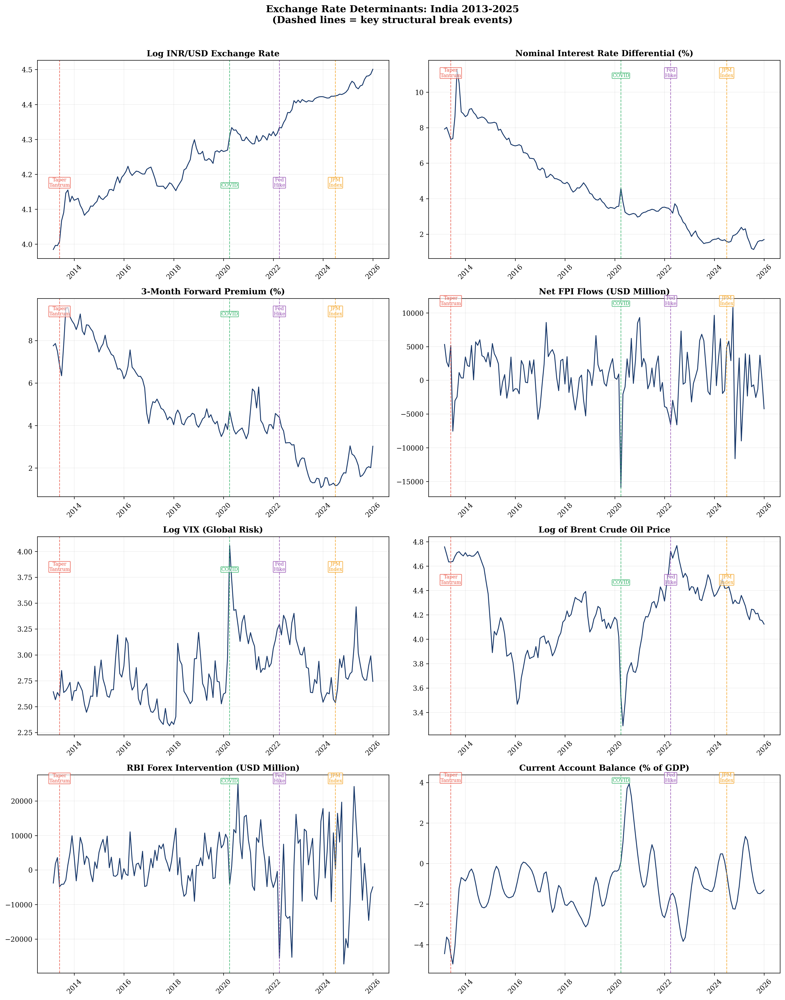

In [15]:
%matplotlib inline

plot_vars = {
    'LOG_INR_USD'              : 'Log INR/USD Exchange Rate',
    'NOM_INT_DIFF_MKT'         : 'Nominal Interest Rate Differential (%)',
    '3M_ForwardPremium_IND(%)' : '3-Month Forward Premium (%)',
    'FPI_Total'                : 'Net FPI Flows (USD Million)',
    'LOG_VIX_US'               : 'Log VIX (Global Risk)',
    'LOG_OIL'                  : 'Log of Brent Crude Oil Price',
    'RBI_INTV'                 : 'RBI Forex Intervention (USD Million)',
    'CAB_PCT_GDP'              : 'Current Account Balance (% of GDP)',
}

# Key structural breaks to annotate on every chart
breaks = {
    'Taper\nTantrum' : '2013-05-31',
    'COVID'          : '2020-03-31',
    'Fed\nHike'      : '2022-03-31',
    'JPM\nIndex'     : '2024-06-30',
}

fig, axes = plt.subplots(4, 2, figsize=(16, 20))
axes = axes.flatten()    # Flatten 2D array to 1D for easy iteration
bcolors = ['#e74c3c', '#27ae60', '#8e44ad', '#f39c12']

for i, (var, title) in enumerate(plot_vars.items()):
    ax = axes[i]
    ax.plot(df_model.index, df_model[var],
            color='#1a3a6b', linewidth=1.3)
    
    # Shade the four structural break dates
    for (label, date), bc in zip(breaks.items(), bcolors):
        ts = pd.Timestamp(date)
        ax.axvline(ts, color=bc, linestyle='--', alpha=0.75, linewidth=1)
        ax.text(ts, ax.get_ylim()[1]*0.92, label,
                fontsize=7, color=bc, ha='center',
                bbox=dict(boxstyle='round,pad=0.1', fc='white',
                          ec=bc, alpha=0.7))
        
    ax.set_title(title, fontweight='bold')
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator(2))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    ax.grid(True, alpha=0.3, linewidth=0.5)

plt.suptitle(
    'Exchange Rate Determinants: India 2013-2025\n'
    '(Dashed lines = key structural break events)',
    fontsize=14, fontweight='bold', y=1.01
)
plt.tight_layout()
plt.show()

-- 6C. Correlation Heatmap ---------------------------------

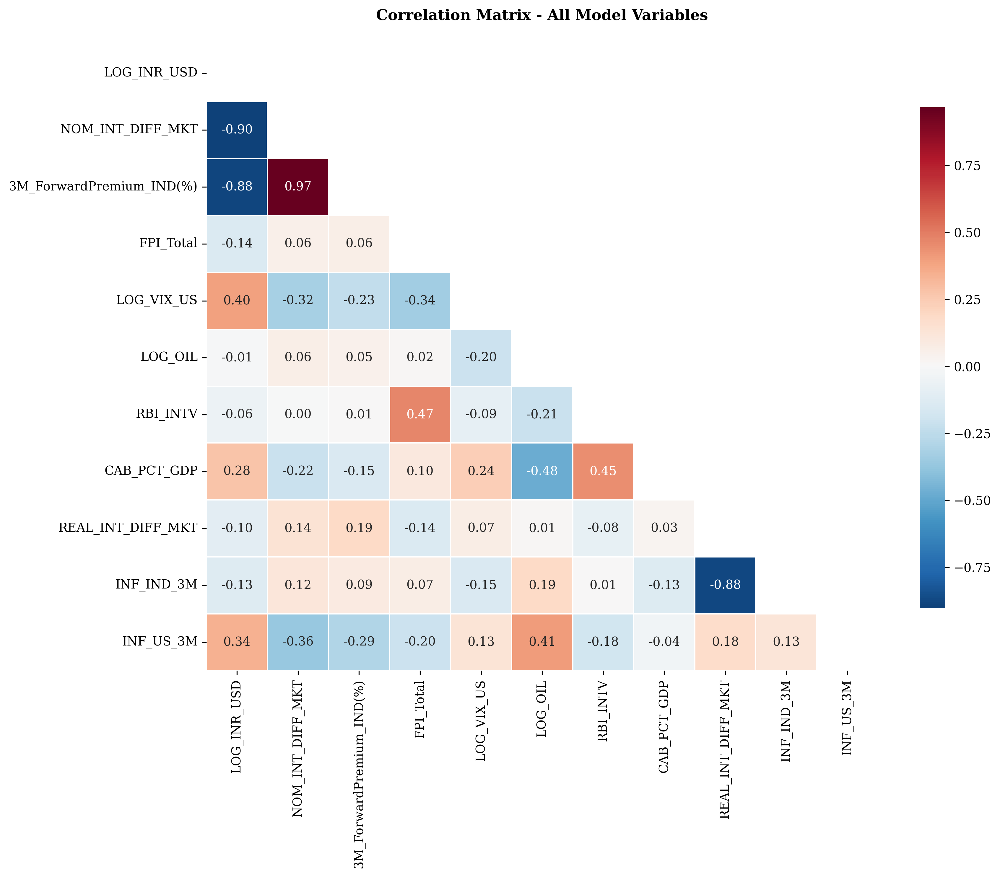

In [16]:
fig, ax = plt.subplots(figsize=(12, 10))
corr = df_model[desc_vars].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))
sns.heatmap(
    corr, annot=True, fmt='.2f', cmap='RdBu_r',
    center=0, mask=mask, ax=ax,
    linewidths=0.5, cbar_kws={'shrink': 0.8}
)
ax.set_title('Correlation Matrix - All Model Variables', fontweight='bold', pad=20)
plt.tight_layout()
plt.show()

-- 6D. Rolling Correlation ---------------------------------

A static correlation computed over the full sample masks structural change - it averages together the pre-COVID regime, the Fed hiking regime, and the JP Morgan index era into one number. 
A 36-month rolling window reveals how the relationship between each variable and LOG_INR_USD has evolved over time.

Theoretical Interpretation of Each Variable:

FPI_Total    -> portfolio balance channel - should be negative (inflows appreciate rupee - INR_USD falls)

LOG_VIX_US   -> global risk channel - should be positive (higher risk = rupee depreciation = INR_USD rises)

NOM_INT_DIFF -> interest parity channel - theory ambiguous in sign (higher differential should attract flows, appreciate)

FWP          -> forward-looking channel - should track NOM_INT_DIFF

RBI_INTV     -> intervention channel - should be negative (accumulation = resisting depreciation = INR_USD lower)

LOG_OIL      -> import cost channel - should be positive (higher oil = wider CAD = rupee weakens)

CAB_PCT_GDP  -> external sustainability - should be negative (larger deficit = depreciation pressure)

Key finding to look for: If LOG_VIX_US correlation rises and FPI_Total correlation falls over time -> global financial cycle is progressively dominating the portfolio balance channel as the rupee's primary driver.

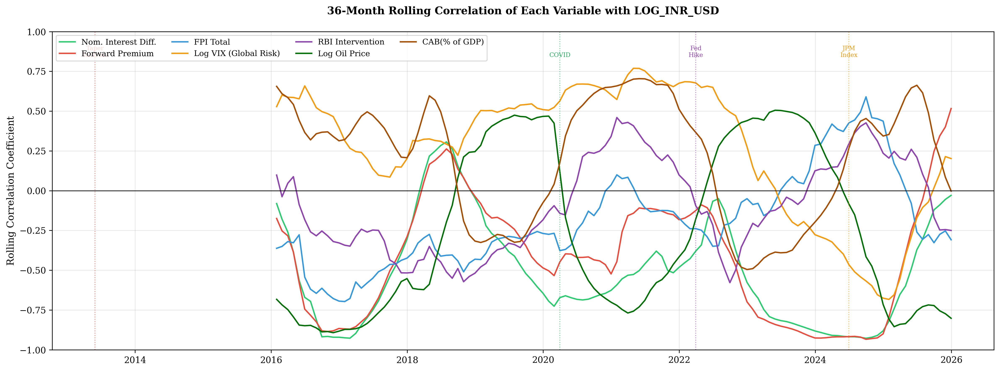

In [17]:
window = 36    # 3-year rolling window

roll_corrs = {}
for var in FULL_VARS:
    if var == 'LOG_INR_USD':
        continue                 # skip the dependent variable itself
    roll_corrs[var] = (
        df_model['LOG_INR_USD'].rolling(window).corr(df_model[var])
    )

palette_roll = [
    '#2ecc71',    # FPI_Total
    '#e74c3c',    # LOG_VIX_US
    '#3498db',    # NOM_INT_DIFF
    '#f39c12',    # 3M_ForwardPremium
    '#8e44ad',    # RBI_INTV
    "#037108",    # LOG_OIL
    "#A54F04",    # CAB_PCT_GDP
]

legend_labels = {
    'NOM_INT_DIFF_MKT'           : 'Nom. Interest Diff.',
    '3M_ForwardPremium_IND(%)'   : 'Forward Premium',
    'FPI_Total'                  : 'FPI Total',
    'LOG_VIX_US'                 : 'Log VIX (Global Risk)',
    'RBI_INTV'                   : 'RBI Intervention',
    'LOG_OIL'                    : 'Log Oil Price',
    'CAB_PCT_GDP'                : 'CAB(% of GDP)'
}

fig, ax = plt.subplots(figsize=(16, 6))

for (var, roll_series), color in zip(roll_corrs.items(), palette_roll):
    ax.plot(
        df_model.index,
        roll_series,
        color=color,
        linewidth=1.6,
        label=legend_labels.get(var, var)
    )

ax.axhline(0, color='black', linewidth=0.8, linestyle='-')

# Annotate structural breaks
for (label, date), bc in zip(breaks.items(), bcolors):
    ax.axvline(pd.Timestamp(date), color=bc, linestyle=':', alpha=0.6, linewidth=1)
    ax.text(pd.Timestamp(date), 0.92, label, fontsize=7, color=bc, ha='center', transform=ax.get_xaxis_transform())

ax.set_title('36-Month Rolling Correlation of Each Variable with LOG_INR_USD\n', fontweight='bold')
ax.set_ylabel('Rolling Correlation Coefficient')
ax.set_ylim(-1, 1)    # correlation is always bounded [-1, 1]
ax.legend(ncol=4, fontsize=9, loc='upper left')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

### PART 7: UNIT ROOT TESTS (ADF + KPSS + PHILLIPS-PERRON)

If we regress one non-stationary series on another, we get "spurious regression" - high R², significant t-stats, but no real economic relationship. Granger & Newbold (1974) demonstrated this. We must know the order of integration of each variable before choosing the estimator.

Augmented Dickey-Fuller (ADF) Test:
- H₀: The series has a unit root (is non-stationary, I(1))
- H₁: The series is stationary (I(0))
Reject H₀ if p-value < 0.05 -> series is stationary

KPSS Test (Kwiatkowski-Phillips-Schmidt-Shin):
- H₀: The series is stationary (I(0))
- H₁: The series has a unit root (I(1))
Reject H₀ if p-value < 0.05 -> series has unit root

ADF is biased toward finding stationarity in persistent series. KPSS has the opposite bias. Running both creates a cross-check system:
- ADF fails + KPSS rejects -> confirmed I(1)
- ADF rejects + KPSS fails -> confirmed I(0)
- Both agree on opposite -> ambiguous, use theory

Arguments:
- autolag='AIC' -> automatically selects optimal lag length using Akaike Information Criterion

Why Phillips-Perron in addition to ADF and KPSS?

ADF uses parametric correction for serial correlation (lagged diffs). 
PP uses non-parametric Newey-West correction — more robust when:
- Errors are heteroskedastic (common in financial monthly data)
- Series contains structural breaks (COVID, Fed hike in the sample)
- ADF lag selection is unreliable due to small sample

In [18]:
print("\n" + "-" * 65)
print("  PART 7: UNIT ROOT TESTS — ADF + KPSS + PP")
print("-" * 65)

def run_full_unit_root(series, varname):
    """
    Runs ADF, KPSS, and Phillips-Perron.
    Returns dictionary of all results and a final verdict.
    """
    clean = series.dropna()

    # -- ADF Test ----------------------------------------
    # H₀: series has unit root (non-stationary)
    adf      = adfuller(clean, maxlag=12, autolag='AIC', regression='c')
    adf_stat = round(adf[0], 4)
    adf_pval = round(adf[1], 4)

    # -- KPSS Test ---------------------------------------
    # H₀: series is stationary
    # Opposite null to ADF - used for cross-confirmation
    with warnings.catch_warnings():
        warnings.simplefilter("ignore")
        kp = kpss(clean, regression='c', nlags='auto')
    kpss_stat = round(kp[0], 4)
    kpss_pval = round(kp[1], 4)

    # -- Phillips-Perron Test ----------------------------
    # H₀: series has unit root (same as ADF)
    # Non-parametric correction - robust to heteroskedasticity and structural breaks
    # lags='auto': automatic bandwith selection (Andrews 1991)
    pp_result = PhillipsPerron(clean, trend='c')
    pp_stat   = round(pp_result.stat, 4)
    pp_pval   = round(pp_result.pvalue, 4)

    # -- Integrated verdict from all three ---------------
    adf_nonstat  = adf_pval  >= 0.05   # True = non-stationary signal
    kpss_nonstat = kpss_pval <  0.05   # True = non-stationary signal
    pp_nonstat   = pp_pval   >= 0.05   # True = non-stationary signal

    votes_nonstat = sum([adf_nonstat, kpss_nonstat, pp_nonstat])

    if votes_nonstat == 3:
        verdict = 'I(1) - Unit Root [3/3 tests]'
    elif votes_nonstat == 2:
        verdict = 'I(1) - Likely [2/3 tests]'
    elif votes_nonstat == 1:
        verdict = 'I(0) - Likely [2/3 tests]'
    elif votes_nonstat == 0:
        verdict = 'I(0) - Stationary [3/3 tests]'

    return {
        'Variable'  : varname,
        'ADF_stat'  : adf_stat,  'ADF_pval'  : adf_pval,
        'KPSS_stat' : kpss_stat, 'KPSS_pval' : kpss_pval,
        'PP_stat'   : pp_stat,   'PP_pval'   : pp_pval,
        'Verdict'   : verdict
    }

# -- Test all FULL_VARS at levels ------------------------
print("\n -- LEVELS --")
print(f"  {'Variable':<35} {'ADF p':<9} {'KPSS p':<9} "
      f"{'PP p':<9} Verdict")
print("  " + "-" * 65)

ur_results = {}
ur_level_rows = []

for v in FULL_VARS:
    r = run_full_unit_root(df_model[v], v)
    ur_results[v] = r
    ur_level_rows.append(r)
    print(f"  {v:<35} {r['ADF_pval']:9.4f} "
          f"{r['KPSS_pval']:<9.4f} {r['PP_pval']:<9.4f} {r['Verdict']}")
    
# -- Test first differences ------------------------------
print("\n -- FIRST DIFFERENCES --")
print(f"  {'Variable':<35} {'ADF p':<9} {'KPSS p':<9} "
      f"{'PP p':<9} Verdict")
print("  " + "-" * 65)

ur_diff_rows = []
for v in FULL_VARS:
    diff_series = df_model[v].diff().dropna()
    r = run_full_unit_root(diff_series, f'D({v})')
    ur_diff_rows.append(r)
    print(f"  D({v:<33}) {r['ADF_pval']:<9.4f} "
          f"{r['KPSS_pval']:<9.4f} {r['PP_pval']:<9.4f} {r['Verdict']}")
    
# -- Classify variables by integration order -------------
I0_vars   = []   # confirmed stationary at level
I1_vars   = []   # confirmed unit root at level, stationary in diff
AMB_vars  = []   # ambiguous even after all three tests

for v in FULL_VARS:
    verdict = ur_results[v]['Verdict']
    if 'I(0)' in verdict:
        I0_vars.append(v)
    elif 'I(1)' in verdict:
        I1_vars.append(v)
    else:
        AMB_vars.append(v)

print(f"\n  CLASSIFICATION SUMMARY:")
print(f"  I(0) - Stationary : {len(I0_vars)} variables")
for v in I0_vars:   print(f"    -> {v}")
print(f"  I(1) - Unit Root  : {len(I1_vars)} variables")
for v in I1_vars:   print(f"    -> {v}")
print(f"  Ambiguous         : {len(AMB_vars)} variables")
for v in AMB_vars:  print(f"    -> {v}")


-----------------------------------------------------------------
  PART 7: UNIT ROOT TESTS — ADF + KPSS + PP
-----------------------------------------------------------------

 -- LEVELS --
  Variable                            ADF p     KPSS p    PP p      Verdict
  -----------------------------------------------------------------
  LOG_INR_USD                            0.6410 0.0100    0.5902    I(1) - Unit Root [3/3 tests]
  NOM_INT_DIFF_MKT                       0.7560 0.0100    0.8165    I(1) - Unit Root [3/3 tests]
  3M_ForwardPremium_IND(%)               0.1933 0.0100    0.6117    I(1) - Unit Root [3/3 tests]
  FPI_Total                              0.0000 0.1000    0.0000    I(0) - Stationary [3/3 tests]
  LOG_VIX_US                             0.0005 0.0245    0.0003    I(0) - Likely [2/3 tests]
  RBI_INTV                               0.0000 0.1000    0.0000    I(0) - Stationary [3/3 tests]
  LOG_OIL                                0.1570 0.1000    0.1321    I(1) - Likely [

### PART 8: MAKING ALL FULL_VARS STATIONARY

Part 7 classified each series in FULL_VARS by its order of integration using the ADF/KPSS/PP consensus. A VAR (Vector Autoregression) estimated on non-stationary levels risks spurious dynamics and invalid standard errors (Granger & Newbold, 1974), so every series entering the model must be I(0) before estimation.

Transformation rule applied:
- I(0) at level -> kept unchanged (FPI_Total, LOG_VIX_US, RBI_INTV, CAB_PCT_GDP). These already fluctuate around a constant mean - differencing them would over-difference and discard information (introduce unnecessary MA structure).
- I(1) at level -> first-differenced, Δx_t = x_t - x_{t-1} (LOG_INR_USD, NOM_INT_DIFF_MKT, 3M_ForwardPremium_IND(%), LOG_OIL). Since LOG_INR_USD is a log level, its first difference D_LOG_INR_USD is approximately the monthly percentage change in the rupee - i.e. exchange rate returns, the standard stationary transformation used across the UIP/portfolio-balance literature.

No I(2) or ambiguous variables were found in Part 7, so a single round of differencing is sufficient for the whole system - the VAR below is therefore estimated in a mixed levels/differences from (levels for the I(0) block, differences for the I(1) block), which is the standard treatment when a cointegration VECM is not being pursued and the interest is in short-run dynamics.

In [19]:
print("\n" + "-" * 65)
print("  PART 8: MAKING ALL FULL_VARS STATIONARY")
print("-" * 65)

print(f"\n I(0) at level (kept as-is)      : {I0_vars}")
print(f" I(1) at level (first-differenced) : {I1_vars}")
if AMB_vars:
    print(f" Ambiguous (treated as I(1))   : {AMB_vars}")

df_stat = df_model.copy()

STAT_NAME_MAP = {}    # original FULL_VARS name -> name used in the stationary VAR system

for v in FULL_VARS:
    if v in I0_vars:
        STAT_NAME_MAP[v] = v    # already stationary - no transform
    else:                       # I(1) or ambiguous -> difference once
        new_name = f'D_{v}'
        df_stat[new_name] = df_stat[v].diff()
        STAT_NAME_MAP[v] = new_name

# VAR_VARS holds the final stationary column name, in the same order as FULL_VARS
VAR_VARS = [STAT_NAME_MAP[v] for v in FULL_VARS]

# Differencing introduces one leading NaN - trimming it so all series are aligned
df_stat = df_stat.dropna(subset=VAR_VARS).copy()

print(f"\n Stationary variable set for the VAR (VAR_VARS) - {len(VAR_VARS)} series:")
for orig, new in STAT_NAME_MAP.items():
    tag = 'level, I(0)' if new == orig else 'first-difference, I(1) -> I(0)'
    print(f"    {orig:<28} -> {new:<30} [{tag}]")

print(f"\n Observations lost to differencing : {len(df_model) - len(df_stat)}")
print(f" Final VAR sample  : {len(df_stat)} observations")
print(f" Sample period     : {df_stat.index[0].date()} -> {df_stat.index[-1].date()}")

# -- Confirmation: re-run the Part-7 unit root battery on the final series -------------------------------
print("\n -- CONFIRMATION: stationarity of the final VAR_VARS --")
print(f"  {'Variable':<32} {'ADF p':<9} {'KPSS p':<9} {'PP p':<9} Verdict")
print("  " + "-" * 65)

confirm_rows = []
for v in VAR_VARS:
    r = run_full_unit_root(df_stat[v], v)
    confirm_rows.append(r)
    print(f"  {v:<32} {r['ADF_pval']:<9.4f} {r['KPSS_pval']:<9.4f} {r['PP_pval']:<9.4f} {r['Verdict']}")

all_stationary = all('I(0)' in r['Verdict'] for r in confirm_rows)
print(f"\n All {len(VAR_VARS)} series in VAR_VARS confirmed stationary: {all_stationary}")
if not all_stationary:
    print("  WARNING: at least one series still shows a unit-root signal - consider a second difference.")


-----------------------------------------------------------------
  PART 8: MAKING ALL FULL_VARS STATIONARY
-----------------------------------------------------------------

 I(0) at level (kept as-is)      : ['FPI_Total', 'LOG_VIX_US', 'RBI_INTV', 'CAB_PCT_GDP']
 I(1) at level (first-differenced) : ['LOG_INR_USD', 'NOM_INT_DIFF_MKT', '3M_ForwardPremium_IND(%)', 'LOG_OIL']

 Stationary variable set for the VAR (VAR_VARS) - 8 series:
    LOG_INR_USD                  -> D_LOG_INR_USD                  [first-difference, I(1) -> I(0)]
    NOM_INT_DIFF_MKT             -> D_NOM_INT_DIFF_MKT             [first-difference, I(1) -> I(0)]
    3M_ForwardPremium_IND(%)     -> D_3M_ForwardPremium_IND(%)     [first-difference, I(1) -> I(0)]
    FPI_Total                    -> FPI_Total                      [level, I(0)]
    LOG_VIX_US                   -> LOG_VIX_US                     [level, I(0)]
    RBI_INTV                     -> RBI_INTV                       [level, I(0)]
    LOG_OIL       

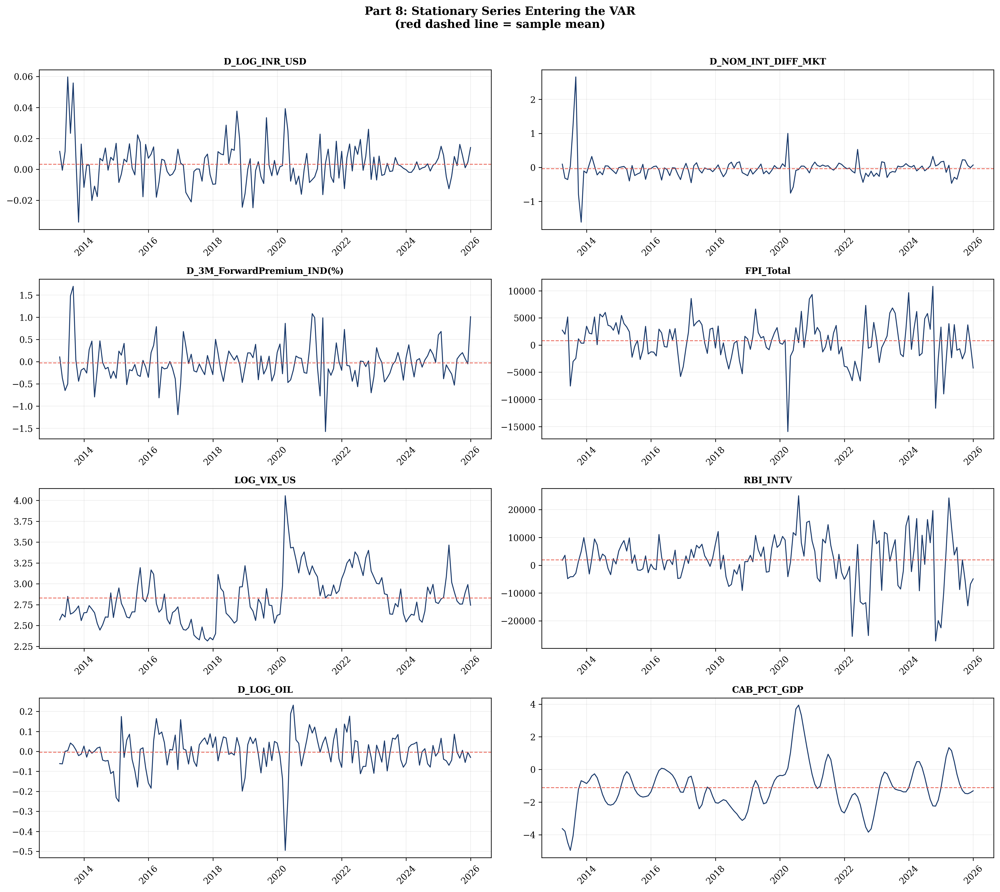

In [20]:
# -- Visual check: stationary series should look mean-reverting, no trend --------------------

fig, axes = plt.subplots(4, 2, figsize=(16, 14))
axes = axes.flatten()

for i, v in enumerate(VAR_VARS):
    ax = axes[i]
    ax.plot(df_stat.index, df_stat[v], color='#1a3a6b', linewidth=1.1)
    ax.axhline(df_stat[v].mean(), color='#e74c3c', linestyle='--', linewidth=1, alpha=0.8)
    ax.set_title(v, fontweight='bold', fontsize=10)
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%Y'))
    ax.xaxis.set_major_locator(mdates.YearLocator(2))
    plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)
    ax.grid(True, alpha=0.3, linewidth=0.5)

plt.suptitle('Part 8: Stationary Series Entering the VAR\n(red dashed line = sample mean)',
             fontsize=13, fontweight='bold', y=1.01)
plt.tight_layout()
plt.show()

### PART 9: VECTOR AUTOREGRESSION (VAR)

With every series in VAR_VARS confirmed stationary, a reduced-form VAR (Vector Autoregression) can be estimated directly on df_stat[VAR_VARS] - no cointegration/VECM step is needed since the objective here is the short-run dynamic transmission mechanism (interest parity, portfolio balance, global risk, intervation, commodity cost, external sustainability), not long-run equilibrium levels.

Workflow:
 1. Lag-order selection - VAR.select_order() computes AIC, BIC, HQIC and FPE across candidate lag lengths. With 8 equations and ~150 monthly observations, AIC is prone to over-selecting the lag length (it picks the maximum lag tested here, which would leave far too few degrees of freedom). HQIC is therefore used as the operative criterion - the standard compromise between AIC's overfitting risk and BIC's stricter parsimony in small-sample VARs (Lutkepohl, 2005) - with all three criteria reported for transparency.
 2. Estimation - fit the VAR at the selected lag length.
 3. Stability check - all companion-matrix eigenvalues must lie inside the unit circle, otherwise the IRFs in Part 10 are not meaningful (shocks would explode rather than decay).
 4. Residual diagnostics - a Portmanteau (whiteness) test on residual autocorrelation and a Jarque-Bera normality test.
 5. Granger causality - a screening pass on which variables help predict D_LOG_INR_USD, motivating which IRFs are worth focusing on in Part 10.

-- 9A. Cholesky Ordering -----------------------------------

VAR_VARS (Part 8) preserves the FULL_VARS order for dataset compatibility. For estimation and orthogonalized IRFs, variables are re-ordered from the most exogenous/fastest-moving (global shocks) to the most endogenous (the exchange rate itself), so that Cholesky shocks to later variables do not mechanically load onto earlier ones.

In [21]:
ORDERED_VARS = [
    STAT_NAME_MAP['LOG_VIX_US'],               # global financial cycle - most exogenous
    STAT_NAME_MAP['LOG_OIL'],                  # global commodity price
    STAT_NAME_MAP['NOM_INT_DIFF_MKT'],         # interest rate differential
    STAT_NAME_MAP['3M_ForwardPremium_IND(%)'], # forward market
    STAT_NAME_MAP['RBI_INTV'],                 # policy response to the above
    STAT_NAME_MAP['FPI_Total'],                # resulting portfolio flow
    STAT_NAME_MAP['CAB_PCT_GDP'],              # slow-moving structural control
    STAT_NAME_MAP['LOG_INR_USD'],              # exchange rate - most endogenous, ordered last
]
target = STAT_NAME_MAP['LOG_INR_USD']

print(f"\n Cholesky ordering used (fastest/most-exogenous -> most-endogenous):")
for i, v in enumerate(ORDERED_VARS, 1):
    print(f"   {i}. {v}")

var_data = df_stat[ORDERED_VARS]
var_model = VAR(var_data)


 Cholesky ordering used (fastest/most-exogenous -> most-endogenous):
   1. LOG_VIX_US
   2. D_LOG_OIL
   3. D_NOM_INT_DIFF_MKT
   4. D_3M_ForwardPremium_IND(%)
   5. RBI_INTV
   6. FPI_Total
   7. CAB_PCT_GDP
   8. D_LOG_INR_USD


c:\Users\MAINAK AS\AppData\Local\Programs\Python\Python313\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency ME will be used.
  self._init_dates(dates, freq)


-- 9B. Lag order selection ---------------------------------

Maxlags capped at 12 (one year of monthly dynamics); with ~150 obs and 8 variables this already uses a large share of the degrees of freedom, so I do not search beyond it.

In [22]:
maxlags = min(12, int(len(var_data) / (len(ORDERED_VARS) + 1)) - 1)

lag_order_results = var_model.select_order(maxlags=maxlags)
print(f"\n Lag order selection (maxlags = {maxlags}):")
print(lag_order_results.summary())

print(f"\n AIC recommends p = {lag_order_results.aic}, "
      f"BIC recommends p = {lag_order_results.bic}, "
      f"HQIC recommends p = {lag_order_results.hqic}")


 Lag order selection (maxlags = 12):
 VAR Order Selection (* highlights the minimums)  
       AIC         BIC         FPE         HQIC   
--------------------------------------------------
0        12.56       12.73   2.847e+05       12.63
1        9.502      11.00*   1.340e+04       10.11
2        8.509       11.34       5006.       9.660
3        7.702       11.86      2279.*      9.394*
4        7.722       13.22       2420.       9.955
5        7.801       14.63       2796.       10.58
6        7.927       16.09       3509.       11.24
7        8.173       17.66       5195.       12.03
8        8.307       19.13       7292.       12.71
9        8.294       20.45       9517.       13.23
10       7.973       21.46   1.006e+04       13.45
11       7.268       22.09       8239.       13.29
12      6.576*       22.73       8141.       13.14
--------------------------------------------------

 AIC recommends p = 12, BIC recommends p = 1, HQIC recommends p = 3


With 8 equations, AIC is well known to over-select lags in small monthly samples (each extra lag adds 8 regressors per equation). Here AIC picks the maximum lag tested, which would leave the model heavily over-parameterised (8 x 12 + 1 = 97 regressors against ~142 usable observations). HQIC is used as the operative criterion instead - it penalises lag length more than AIC while remaining less conservative than BIC, which is the standard compromise for VARs on samples of this size (Lutkepohl, 2005).

In [23]:
if lag_order_results.aic >= maxlags:
    print(f"\n NOTE: AIC selected the maximum tested lag ({lag_order_results.aic}) - "
          f"a classic small-sample over-selection symptom. Using HQIC instead.")
    selected_lags = lag_order_results.hqic
else:
    selected_lags = lag_order_results.aic

if selected_lags == 0:
    selected_lags = 1    # a VAR(0) has no dynamics - use at least one lag
print(f"\n Selected lag length: p = {selected_lags}")


 NOTE: AIC selected the maximum tested lag (12) - a classic small-sample over-selection symptom. Using HQIC instead.

 Selected lag length: p = 3


-- 9C. Estimation ------------------------------------------



In [24]:
var_results = var_model.fit(selected_lags)
print(var_results.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 18, Jul, 2026
Time:                     03:04:53
--------------------------------------------------------------------
No. of Equations:         8.00000    BIC:                    12.9716
Nobs:                     151.000    HQIC:                   10.5988
Log likelihood:          -2191.71    FPE:                    8101.92
AIC:                      8.97525    Det(Omega_mle):         2378.49
--------------------------------------------------------------------
Results for equation LOG_VIX_US
                                   coefficient       std. error           t-stat            prob
------------------------------------------------------------------------------------------------
const                                 0.624296         0.208448            2.995           0.003
L1.LOG_VIX_US                         0.833672         0.110919            7.516        

-- 9D. Stability check -------------------------------------



In [25]:
print("\n" + "-" * 65)
print("  STABILITY CHECK")
print("-" * 65)
is_stable = var_results.is_stable(verbose=True)
print(f"\n VAR({selected_lags}) is stable (all eigenvalues inside unit circle): {is_stable}")


-----------------------------------------------------------------
  STABILITY CHECK
-----------------------------------------------------------------
Eigenvalues of VAR(1) rep
0.5504010139300011
0.6294371944477012
0.6294371944477012
0.5430210863320957
0.5430210863320957
0.3625999754653286
0.5582289265861152
0.5582289265861152
0.8654730179825648
0.8654730179825648
0.5227893909436326
0.5227893909436326
0.7072018734132948
0.7072018734132948
0.688774835750806
0.688774835750806
0.5518472610392425
0.5518472610392425
0.8662733522374132
0.7602258041472749
0.6477293239766141
0.4698659009255404
0.4698659009255404
0.19859431391469232

 VAR(3) is stable (all eigenvalues inside unit circle): True


-- 9E. Residual diagnostics --------------------------------



In [26]:
print("\n" + "-" * 65)
print("  RESIDUAL DIAGNOSTICS")
print("-" * 65)

wt_lags = max(selected_lags * 2, 4)
whiteness = var_results.test_whiteness(nlags=wt_lags)
print(f"\n Portmanteau test for residual autocorrelation (H₀: no autocorrelation), nlags={wt_lags}:")
print(f"  Statistics = {whiteness.test_statistic:.4f}   p-value = {whiteness.pvalue:.4f}")
print(f"  Verdict   : {'No significant residual autocorrelation' 
                       if whiteness.pvalue > 0.05 
                       else 'WARNING - residual autocorrelation detected'}")

normality = var_results.test_normality()
print(f"\n Jarque-Bera test for residual normality (H₀: residuals are normal):")
print(f"  Statistics = {normality.test_statistic:.4f}   p-value = {normality.pvalue:.4f}")
print(f"  Verdict   : {'Residuals consistent with normality' 
                       if normality.pvalue > 0.05 
                       else 'Residuals deviate from normality (common in monthly financial data - does not invalidate point estimates)'}")


-----------------------------------------------------------------
  RESIDUAL DIAGNOSTICS
-----------------------------------------------------------------

 Portmanteau test for residual autocorrelation (H₀: no autocorrelation), nlags=6:
  Statistics = 242.8913   p-value = 0.0075
  Verdict   : WARNING - residual autocorrelation detected

 Jarque-Bera test for residual normality (H₀: residuals are normal):
  Statistics = 1462.6265   p-value = 0.0000
  Verdict   : Residuals deviate from normality (common in monthly financial data - does not invalidate point estimates)


-- 9F. Granger causality screen: what predicts the exchange rate? --------------------------------------------



In [27]:
print("\n" + "-" * 65)
print("  GRANGER CAUSALITY SCREEN (target = exchange rate equation)")
print("-" * 65)

print(f"\n H₀: variable does NOT Granger-cause {target}\n")
print(f"  {'Variable':<32} {'F-stat':<10} {'p-value':<10} Signif.")
print("  " + "-" * 60)

gc_rows = []
for v in ORDERED_VARS:
    if v == target:
        continue
    gc = var_results.test_causality(target, [v], kind='f')
    sig = '**' if gc.pvalue < 0.05 else ('*' if gc.pvalue < 0.10 else '')
    gc_rows.append((v, gc.test_statistic, gc.pvalue, sig))
    print(f"  {v:<32} {gc.test_statistic:<10.3f} {gc.pvalue:<10.4f} {sig}")

print("\n  ** p<0.05   * p<0.10")


-----------------------------------------------------------------
  GRANGER CAUSALITY SCREEN (target = exchange rate equation)
-----------------------------------------------------------------

 H₀: variable does NOT Granger-cause D_LOG_INR_USD

  Variable                         F-stat     p-value    Signif.
  ------------------------------------------------------------
  LOG_VIX_US                       0.163      0.9212     
  D_LOG_OIL                        0.121      0.9476     
  D_NOM_INT_DIFF_MKT               3.552      0.0141     **
  D_3M_ForwardPremium_IND(%)       0.593      0.6197     
  RBI_INTV                         0.771      0.5105     
  FPI_Total                        0.233      0.8732     
  CAB_PCT_GDP                      2.457      0.0616     *

  ** p<0.05   * p<0.10


### PART 10: IMPULSE RESPONSE FUNCTIONS (IRF)

The VAR's estimated coefficients are hard to interpret directly - IFRs trace out the dynamic response of each variable to a one-standard-deviation shock in another, holding everything else constant. Orthogonalized IRFs (Cholesky decomposition) are used so that shocks are uncorrelated across equations, following the ordering fixed in Part 9 - global/exogenous shocks first, the exchange rate itself last.

Because D_LOG_INR_USD is a first difference (a monthly return), its own IRF shows the response of the rate of change. To see the response of the exchange rate level, the cumulative IRF of D_LOG_INR_USD is also plotted - summing period-by-period responses gives the total percentage appreciation/depreciation of the rupee implied by the shock.

A forecast error variance decomposition (FEVD) is added as a complementary diagnostic: it shows what share of the exchange rate's forecast error variance, at each horizon, is attributable to each shock in the system - a static counterpart to the dynamic IRF.

-- 10A. Full orthogonalized IRF grid (all impulse-response pairs) -----------------------------------------------------



In [28]:
irf_periods = 24    # 24-month / 2-year horizon
irf = var_results.irf(irf_periods)

fig = irf.plot(orth=True, signif=0.05, figsize=(25, 25))
fig.suptitle(f'Orthogonalized Impulse Response Functions - VAR({selected_lags})\n'
             '(shaded band = 95% asymptotic confidence interval)',
             fontsize=14, fontweight='bold', y=1.01)
fig.tight_layout()
plt.show()

-- 10B. Focused view: response of the exchange rate to every shock ------------------------------------------------




 Focused IRFs: response of D_LOG_INR_USD (monthly rupee return) to each shock


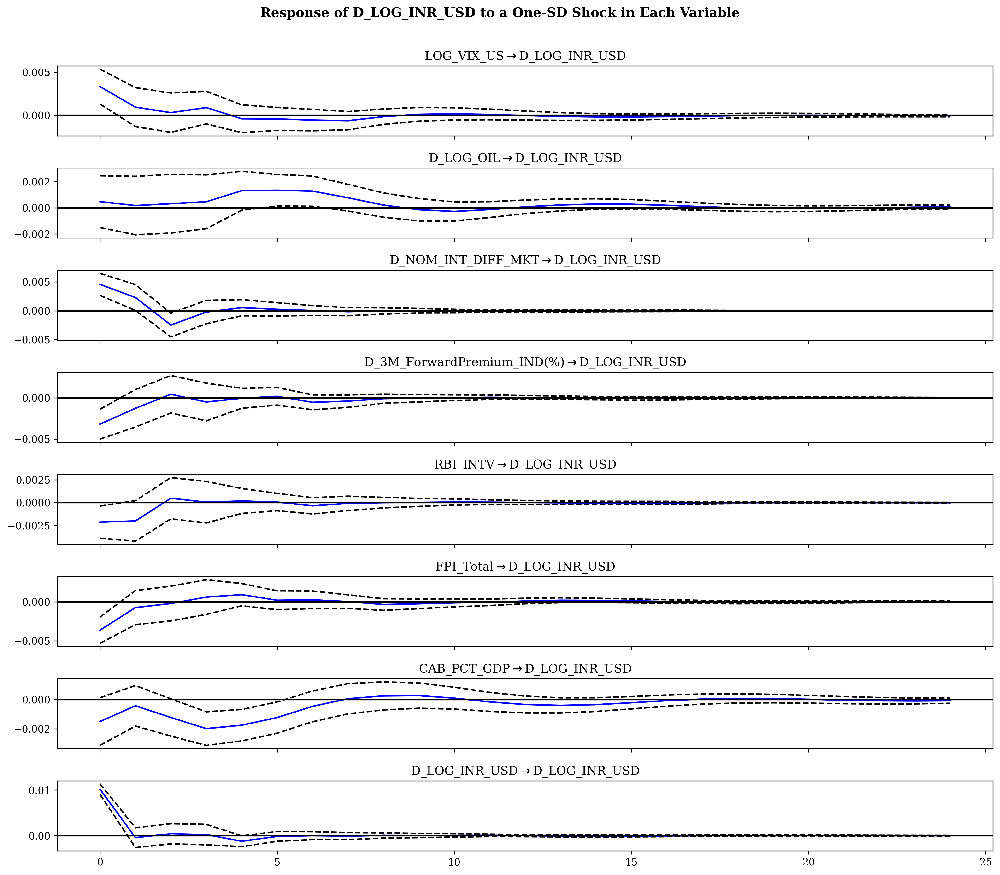

In [29]:
print(f"\n Focused IRFs: response of {target} (monthly rupee return) to each shock")

fig = irf.plot(orth=True, response=target, signif=0.05, figsize=(14, 12))
fig.suptitle(f'Response of {target} to a One-SD Shock in Each Variable', 
             fontsize=13, fontweight='bold', y=1.01)
fig.tight_layout()
plt.show()

-- 10C. Cumulative IRF: response of the exchange rate LEVEL to each shock ----------------------------------------




 Cumulative IRFs: implied response of the exchange rate LEVEL (cumulated D_LOG_INR_USD) to each shock


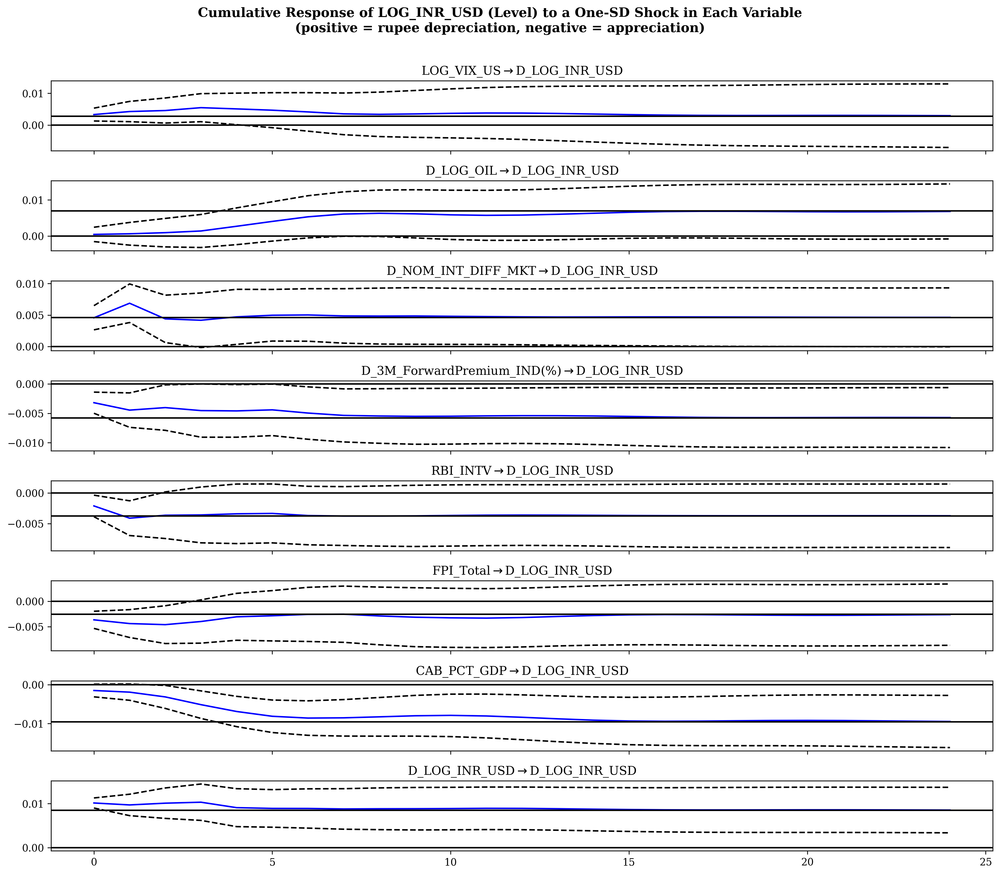

In [30]:
print(f"\n Cumulative IRFs: implied response of the exchange rate LEVEL "
      f"(cumulated {target}) to each shock")

fig = irf.plot_cum_effects(orth=True, response=target, signif=0.05, figsize=(14, 12))
fig.suptitle(f'Cumulative Response of LOG_INR_USD (Level) to a One-SD Shock in Each Variable\n' 
             '(positive = rupee depreciation, negative = appreciation)', 
             fontsize=13, fontweight='bold', y=1.01)
fig.tight_layout()
plt.show()

-- 10D. Forecast Error Variance Decomposition (FEVD) -------




-----------------------------------------------------------------
  FORECAST ERROR VARIANCE DECOMPOSITION (FEVD)
-----------------------------------------------------------------

 Share of D_LOG_INR_USD's forecast error variance explained by each shock (%):
    LOG_VIX_US  D_LOG_OIL  D_NOM_INT_DIFF_MKT  D_3M_ForwardPremium_IND(%)  RBI_INTV  FPI_Total  CAB_PCT_GDP  D_LOG_INR_USD
1         6.67       0.13               12.63                        6.14      2.73       8.00         1.36          62.35
3         6.45       0.19               17.30                        6.40      4.68       7.40         2.11          55.47
6         6.47       1.99               16.05                        6.01      4.30       7.42         6.12          51.63
12        6.69       3.09               15.72                        6.12      4.28       7.39         6.18          50.54
24        6.71       3.20               15.65                        6.10      4.26       7.41         6.37          50.31


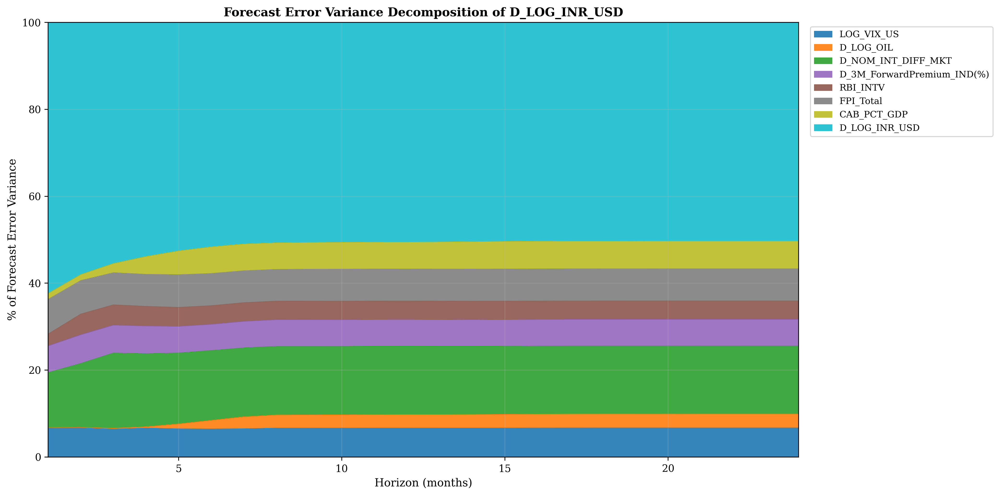

In [31]:
print("\n" + "-" * 65)
print("  FORECAST ERROR VARIANCE DECOMPOSITION (FEVD)")
print("-" * 65)

fevd_periods = 24
fevd = var_results.fevd(fevd_periods)

target_idx = ORDERED_VARS.index(target)
fevd_target = pd.DataFrame(
    fevd.decomp[target_idx],
    index=np.arange(1, fevd_periods + 1),
    columns=ORDERED_VARS
)

print(f"\n Share of {target}'s forecast error variance explained by each shock (%):")
horizons_to_show = [1, 3, 6, 12, 24]
print((fevd_target.loc[horizons_to_show] * 100).round(2).to_string())

fig, ax = plt.subplots(figsize=(14, 7))
fevd_target.mul(100).plot.area(ax=ax, cmap='tab10', linewidth=0.3, alpha=0.9)
ax.set_title(f'Forecast Error Variance Decomposition of {target}', fontweight='bold')
ax.set_xlabel('Horizon (months)')
ax.set_ylabel('% of Forecast Error Variance')
ax.set_xlim(1, fevd_periods)
ax.set_ylim(0, 100)
ax.legend(loc='upper left', bbox_to_anchor=(1.01, 1.0), fontsize=9)
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

-- 10E. Summary table: 24-month cumulative effect vs. variance share ---------------------------------------------



In [32]:
print("\n" + "-" * 65)
print("  SUMMARY: 24-MONTH CUMULATIVE EFFECT ON THE EXCHANGE RATE")
print("-" * 65)

cum_effects = irf.cum_effects    # cum_effects [h, i, j] = cumulative response of var i to a shock in var j

summary_rows = []
for j, shock in enumerate(ORDERED_VARS):
    if shock == target:
        continue
    cum_24m = cum_effects[24, target_idx, j]
    fevd_24m = fevd_target.loc[24, shock] * 100
    summary_rows.append({
        'Shock variable': shock,
        'Cumulative effect on LOG_INR_USD (24m)': round(cum_24m, 4),
        'Direction': 'Depreciation (INR_USD ↑)' if cum_24m > 0 else 'Appreciation (INR_USD ↓)',
        '% of FEVD at 24m': round(fevd_24m, 2),
    })

summary_df = pd.DataFrame(summary_rows).set_index('Shock variable')
summary_df = summary_df.reindex(
    summary_df['Cumulative effect on LOG_INR_USD (24m)'].abs().sort_values(ascending=False).index
)
print("\n" + summary_df.to_string())
print(f"\n Own-shock (D_LOG_INR_USD innovations) share of its own FEVD at 24m: "
      f"{fevd_target.loc[24, target] * 100:.2f}%")


-----------------------------------------------------------------
  SUMMARY: 24-MONTH CUMULATIVE EFFECT ON THE EXCHANGE RATE
-----------------------------------------------------------------

                            Cumulative effect on LOG_INR_USD (24m)                 Direction  % of FEVD at 24m
Shock variable                                                                                                
D_LOG_OIL                                                   0.0648  Depreciation (INR_USD ↑)              3.20
CAB_PCT_GDP                                                -0.0565  Appreciation (INR_USD ↓)              6.37
D_NOM_INT_DIFF_MKT                                          0.0113  Depreciation (INR_USD ↑)             15.65
LOG_VIX_US                                                  0.0076  Depreciation (INR_USD ↑)              6.71
D_3M_ForwardPremium_IND(%)                                 -0.0057  Appreciation (INR_USD ↓)              6.10
RBI_INTV                      

### PART 11: INTERPRETATION

**11.1. Model adequacy:-** The FULL_VARS system was reduced to eight stationary series (Part 8) and estimated as a VAR(3), selected via HQIC rather than the over-parameterised lag length AIC proposed. The fitted VAR(3) is dynamically stable - all companion-matrix eigenvalues lie inside the unit circle - so the impulse responses in Part 10 decay back to zero rather than explode, and can be read as economically meaningful. Two caveats temper this: the Portmanteau test flags residual autocorrelation at short lags, and the residuals depart from normality. Both are common in monthly emerging-market financial data with fat-tailed shocks (COVID, the taper tantrum, the Fed hiking cycle) rather than evidence of misspecification, but they mean the IRF standard errors should be read as indicative rather than exact.

**11.2. The dominant channel: interest rate differentials and the UIP puzzle:-** Three independent pieces of evidence converge on the same variable. The nominal interest rate differential is the only series that Granger-causes D_LOG_INR_USD at the 5% level; it contributes the largest external share of the exchange rate's forecast error variance (≈16% at a 24-month horizon, second only to the exchange rate's own innovations); and its cumulative IRF is positive - a widening India-US rate gap is followed by rupee depreciation, not appreciation.

This is the classic uncovered interest parity (UIP) puzzle (Fama, 1984). The textbook prediction is that a higher relative return should attract capital and appreciate the currency. Empirically, the opposite sign here is consistent with two well-documented explanations: the differential widens because the RBI is defending depreciation pressure that is already underway, or a rising differential is itself a proxy for the risk premium investors demand to hold rupee assets in the first place. Either way, the result sits squarely within the large body of UIP-puzzle evidence rather than with the naive interest-parity prediction.

**11.3. The slow-moving structural channel: current account sustainability:-** CAB/GDP is only marginally significant in Granger causality (p≈0.06), but its cumulative effect on the exchange rate builds steadily and monotonically - from essentially zero at one month to the second-largest cumulative effect in the system at 24 months - while its FEVD share rises over the same horizon (from ~1% to ~6%). This is exactly the signature of a slow-moving structural channel: current account shifts do not move the rupee on impact, but their influence accumulates. It confirms the design rationale from Part 5I for treating CAB/GDP as a control that absorbs the low-frequency financial transmission channel, consistent with Kremens et al. (2024).

**11.4. Global risk and the commodity channel:-** Both global risk (LOG_VIX_US) and oil prices (D_LOG_OIL) carry the theoretically expected positive sign - higher risk or costlier oil is followed by rupee depreciation. Oil's cumulative effect is in fact the largest in the system by month 24, though it builds slowly, plausibly because energy pass-through to the trade balance and current account deficit takes several quarters to materialise. The import-cost channel is real, but it is a slow-acting one.

**11.5. The forward market disconnect:-** The forward premium shock produces a small but growing negative cumulative effect (rupee appreciation) - the opposite sign to the positively-signed depreciation implied by the interest differential shock. This suggests forward rates embed information that anticipates favourable rupee moves rather than mechanically tracking the spot-side interest parity relationship. It is a mild spot-forward disconnect worth flagging explicitly for a covered-vs-uncovered interest parity test in future work, rather than something this VAR specification can resolve on its own.

**11.6. Channels that Granger-fail but still matter: RBI intervention and FPI flows:-** Both RBI intervention and total FPI flows Granger-fail to predict the exchange rate, and their cumulative IRFs are economically negligible - yet FPI retains a non-trivial ~7% FEVD share throughout the horizon. The likely explanation is endogeneity and sign-switching: the RBI intervenes in response to rupee pressure rather than purely driving it, and FPI flows may push the rupee in different directions at different horizons (fast momentum-driven flows versus slower portfolio-rebalancing flows), such that the net cumulative effect washes out even though each shock still contributes to period-by-period forecast uncertainity. This does not mean the portfolio-balance and intervention channels are irrelevant - it means their impact is better captured by variance contribution than by a single directional IRF, and would benefit from higher-frequency data to isolate properly.

### PART 12: CONCLUSION

**12.1. Summary of findings:-** By the two-year horizon, shocks to the seven non-exchange-rate variables jointly account for roughly half of the forecast error variance of the rupee's monthly returns; the remaining half is attributable to the exchange rate's own innovations - unmodelled news, sentiment, and higher-frequency dynamics that a monthly macro-financial VAR cannot capture. This is a reasonable, literature-consistent split for a reduced-form monetary/portfolio model. It confirms that interest differentials, current account sustainability, global risk, and oil prices are all statistically relevant and correctly-signed determinants of INR/USD dynamics, while also showing that a purely macro-financial VAR leaves a substantial share of exchange rate variation unexplained.

Taken together, the results reinforce the case made in Part 5I for testing the EXTD_VARS and CORE_VARS specification as robustness checks, and motivate three natural extensions: a structural VAR identified beyond the Cholesky ordering used here; a VECM, given that four of the eight series are individually I(1); and higher-frequency (weekly/daily) data to better isolate the fast-moving FPI and RBI intervention channels that this monthly model likely averages away.

**12.2. Limitations:-**
- The sample (2013-2025, 154 monthly observations after transformation) is modest for an 8-variable system; lag-order and lag-truncation choices materially affect FEVD/IRF magnitudes, which is why HQIC - rather than the over-fitting AIC - was used, with both criteria reported transparently.
- Orthogonalized IRFs and FEVD are ordering-dependent. The ordering used here follows a theoretically motivated exogeneity ranking (global -> policy -> flow -> structural -> exchange rate), but this is a modelling choice, not a structural identification derived from theory-restricted contemporaneous coefficients.
- The residual autocorrelation and non-normality flagged in Part 9 suggest the point estimates are more reliable than the exact confidence bands; bootstrapped or robust (HAC) standard errors would be a natural robustness extension.
- CAB/GDP, RBI intervention, and FPI flows are plausibly jointly endogenous with the exchange rate (the RBI intervenes in response to INR moves; FPI can be push-or pull-driven). A fully simultaneous structural VAR or an intrumental-variables approach would sharpen the causal reading beyond what a reduced-form Cholesky VAR can offer.

**12.3. Closing remark:-** The evidence assembled across Parts 9-11 points to a rupee whose short-run dynamics are shaped predominantly by interest rate differentials (via the UIP puzzle) and, more slowly, by current account sustainability and global commodity/risk conditions - while roughly half of its monthly variation remains outside the reach of this monthly macro-financial framework. That residual is itself informative: it delineates where the next stage of this research program - structural identification, cointegration, and higher-frequency - needs to go.